In [1]:
import cv2
import numpy as np
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely import wkt

In [2]:
# Load the GeoJSON
gdf_combined = gpd.read_file('data/Street_view/Preprocessed_to_use_for_picture_extraction.geojson')

# Recreate geometry_midpoint from midpoint_x and midpoint_y
gdf_combined['geometry_midpoint'] = gdf_combined.apply(lambda row: Point(row['midpoint_x'], row['midpoint_y']), axis=1)

# Convert the geometry_outer_edge from string to LineString
gdf_combined['geometry_outer_edge'] = gdf_combined['geometry_outer_edge'].apply(wkt.loads)


In [5]:
def calculate_yaw_pitch(camera_coords, target_coords):
    x1, y1, z1 = camera_coords
    x2, y2, z2 = target_coords

    dx = x2 - x1
    dy = y2 - y1
    dz = z2 - z1
    
    horizontal_distance = np.sqrt(dx**2 + dy**2)
    
    if horizontal_distance < 1e-6:
        print("Warning: Camera and target are very close or directly above/below each other.")
        return 0, 90 if dz >= 0 else -90

    yaw = np.arctan2(-dy, -dx)
    yaw_deg = np.degrees(yaw)
    yaw_deg = (yaw_deg + 360) % 360
    
    pitch = np.arctan2(dz, horizontal_distance)
    pitch_deg = np.degrees(pitch)
    
    return yaw_deg, pitch_deg


def enhanced_equirectangular_to_perspective(img, fov, theta, phi, roll, height, width, output_scale=2):
    fov, theta, phi, roll = map(np.radians, (fov, theta, phi, roll))
    
    h, w = img.shape[:2]
    
    # Increase output size
    height *= output_scale
    width *= output_scale
    
    f = width / (2 * np.tan(fov / 2))
    
    Rx = np.array([[1, 0, 0], [0, np.cos(phi), -np.sin(phi)], [0, np.sin(phi), np.cos(phi)]])
    Ry = np.array([[np.cos(theta), 0, np.sin(theta)], [0, 1, 0], [-np.sin(theta), 0, np.cos(theta)]])
    Rz = np.array([[np.cos(roll), -np.sin(roll), 0], [np.sin(roll), np.cos(roll), 0], [0, 0, 1]])
    
    R = Rz @ Ry @ Rx
    
    y, x = np.indices((height, width))
    x = (x - width / 2) / f
    y = (y - height / 2) / f
    
    directions = np.dstack([x, y, np.ones_like(x)])
    directions /= np.linalg.norm(directions, axis=2, keepdims=True)
    
    directions = directions @ R.T
    
    theta_p = np.arctan2(directions[:,:,0], directions[:,:,2])
    phi_p = np.arcsin(np.clip(directions[:,:,1], -1, 1))
    
    u = (theta_p / (2 * np.pi) + 0.5) * w
    v = (phi_p / np.pi + 0.5) * h
    
    u = np.clip(u, 0, w - 1)
    v = np.clip(v, 0, h - 1)
    
    u_floor, v_floor = np.floor(u).astype(int), np.floor(v).astype(int)
    u_ceil, v_ceil = np.minimum(u_floor + 1, w - 1), np.minimum(v_floor + 1, h - 1)
    
    wu, wv = u - u_floor, v - v_floor
    
    top_left = img[v_floor, u_floor]
    top_right = img[v_floor, u_ceil]
    bottom_left = img[v_ceil, u_floor]
    bottom_right = img[v_ceil, u_ceil]
    
    output = (1 - wu[:,:,np.newaxis]) * ((1 - wv[:,:,np.newaxis]) * top_left + wv[:,:,np.newaxis] * bottom_left) + \
              wu[:,:,np.newaxis] * ((1 - wv[:,:,np.newaxis]) * top_right + wv[:,:,np.newaxis] * bottom_right)
    
    return output.astype(np.uint8)


def calculate_dynamic_fov(v1, v2):
    v1 = np.array(v1)
    v2 = np.array(v2)
    
    dot_product = np.dot(v1, v2)
    magnitude_product = np.linalg.norm(v1) * np.linalg.norm(v2)
    
    fov_radians = np.arccos(dot_product / magnitude_product)
    fov_degrees = np.degrees(fov_radians)
    
    fov = min(fov_degrees, 100)
    return fov


def calculate_vectors(camera_coords, target_coords):
    camera = np.array(camera_coords)
    target = np.array(target_coords)
    
    v2 = target - camera
    v1 = np.array([1, 0, 0])
    
    return v1, v2


def adjust_fov_based_on_distance(camera_coords, target_coords, calculated_fov, facade_length):
    x1, y1, _ = camera_coords
    x2, y2, _ = target_coords
    distance = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
    if facade_length < 10:
        if 3.5 < distance < 5:
            adjusted_fov = 90
        elif distance < 3.5:
            adjusted_fov = 95
        else:
            adjusted_fov = calculated_fov
    else:
        if 3.5 < distance < 5:
            adjusted_fov = 100
        elif distance < 3.5:
            adjusted_fov = 105
        else:
            adjusted_fov = calculated_fov
    return adjusted_fov, distance

def project_point_onto_segment(camera, facade_start, facade_end):
    camera = np.array(camera)
    facade_start = np.array(facade_start)
    facade_end = np.array(facade_end)
    
    AB = facade_end - facade_start
    AP = camera - facade_start
    
    AB_squared = np.dot(AB, AB)
    if AB_squared == 0:
        return facade_start
    
    t = np.dot(AP, AB) / AB_squared
    t = np.clip(t, 0, 1)
    
    projected_point = facade_start + t * AB
    return projected_point


def evaluate_fov_for_multiple_points(camera_coords, midpoint_coords, facade_start, facade_end, z_value, facade_length):
    """
    Evaluate the FOV for 6 points: the facade extremes, midpoint, projection, and the midpoints between the midpoint and the extremes.
    Return the point with the lowest FOV.
    """
    # Define the six points to evaluate
    points = {
        "midpoint": midpoint_coords,
        "facade_end": np.array([facade_end[0], facade_end[1], z_value]),
        "projected": np.array([*project_point_onto_segment(camera_coords[:2], facade_start, facade_end), z_value]),
        "mid_mid_start": np.array([(midpoint_coords[0] + facade_start[0]) / 2, (midpoint_coords[1] + facade_start[1]) / 2, z_value]),
        "mid_mid_end": np.array([(midpoint_coords[0] + facade_end[0]) / 2, (midpoint_coords[1] + facade_end[1]) / 2, z_value])
    }
    
    # Evaluate FOV for each point
    fov_results = []
    projected_result = None
    for point_name, target_coords in points.items():
        yaw, pitch = calculate_yaw_pitch(camera_coords, target_coords)
        v1, v2 = calculate_vectors(camera_coords, target_coords)
        fov = calculate_dynamic_fov(v1, v2)
        fov_adjusted, distance = adjust_fov_based_on_distance(camera_coords, target_coords, fov, facade_length)
        
        # Store the result for each point
        fov_results.append((fov, fov_adjusted, target_coords, yaw, pitch, point_name))
        
        # Capture the projected point's result
        if point_name == "projected":
            projected_result = (fov_adjusted, target_coords, yaw, pitch, distance)

    # If distance is less than 5 meters, return the projected point with adjusted FOV
    if projected_result[4] < 5:
        print(f"Using projection-based method due to close distance (<5m).")
        print(f"Best FOV: {projected_result[0]} from projected")
        return projected_result[1], projected_result[2], projected_result[3], projected_result[0]
    elif projected_result[4] > 15:
        print("Facade to far from camera, probably part of block not facing street")
        return None, None, None, None
    
    # Otherwise, work with facade length, if lower than 10 m it is ok to minimiz fov, otherwise maximize it
    if facade_length < 10:
        print("Maximizing FOV (facade length <10m).")
        best_fov, best_fov_adjusted, best_target, best_yaw, best_pitch, best_point_name = min(fov_results, key=lambda x: x[1])
    else:
        print("Minimizing FOV (facade length >10m).")
        best_fov, best_fov_adjusted, best_target, best_yaw, best_pitch, best_point_name = max(fov_results, key=lambda x: x[1])
    # if fov still less than 80, use 90
    if best_fov_adjusted < 80:
        print("Setting FOV to 90.")
        best_fov_adjusted = 90
    print(f"Best FOV: {best_fov_adjusted} from {best_point_name}")
    
    return best_target, best_yaw, best_pitch, best_fov_adjusted


def convert_bgr_to_rgb(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


def calculate_pitch_adjustment_based_on_distance(camera_coords, midpoint_coords, base_pitch):
    x1, y1, _ = camera_coords
    x2, y2, _ = midpoint_coords
    
    distance = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
    
    if distance < 3.5:
        pitch_adjustment = base_pitch + 25
    elif distance < 5:
        pitch_adjustment = base_pitch + 25
    else:
        pitch_adjustment = base_pitch + 25 
    
    return pitch_adjustment

Facade length: 3.496400722183424
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 34 182136815 POINT (605189.9574258039 4962337.061895148) S pano_000117_000042.jpg


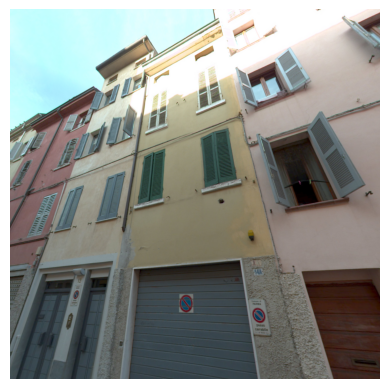

Facade length: 3.6879746063458603
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 76 182137529 POINT (605186.7396445274 4962338.653721904) S pano_000117_000043.jpg


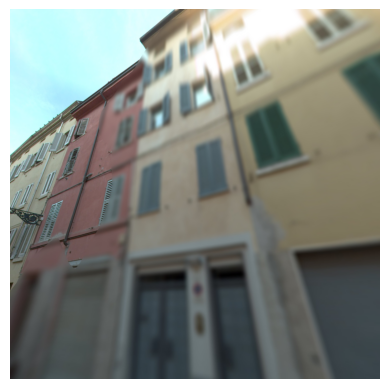

Facade length: 5.397862226326041
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 124 182138139 POINT (605182.7413835118 4962340.810570208) S pano_000117_000045.jpg


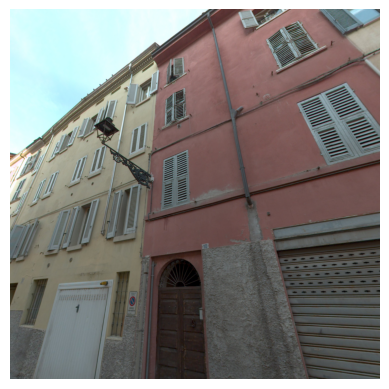

Facade length: 7.268417831990032
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 12 182136647 POINT (605177.147803768 4962343.780226035) S pano_000117_000047.jpg


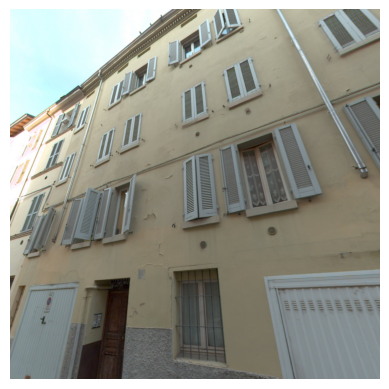

Facade length: 3.7779998186075825
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 12 182136647 POINT (605172.1463701997 4962346.092892471) S pano_000117_000049.jpg


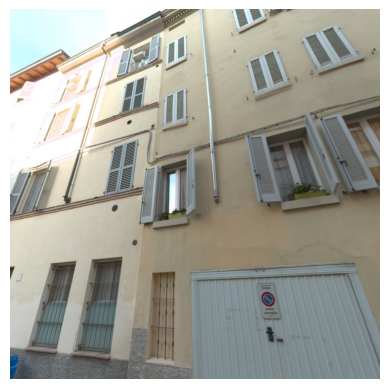

Facade length: 5.864028209880658
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 117 182137984 POINT (605167.5844215297 4962347.651625912) S pano_000117_000050.jpg


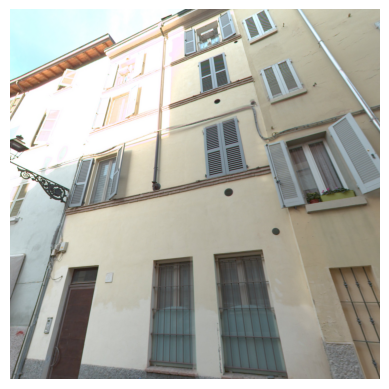

Facade length: 18.91895230785262
Using projection-based method due to close distance (<5m).
Best FOV: 105 from projected
block_0 168 2427045 POINT (605155.8669034896 4962351.6822555065) S pano_000117_000054.jpg


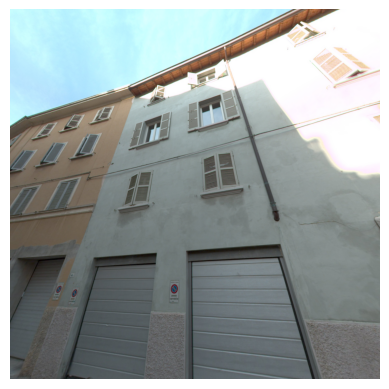

Facade length: 7.44328215308601
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 64 182137239 POINT (605143.4584482685 4962356.123825394) S pano_000117_000059.jpg


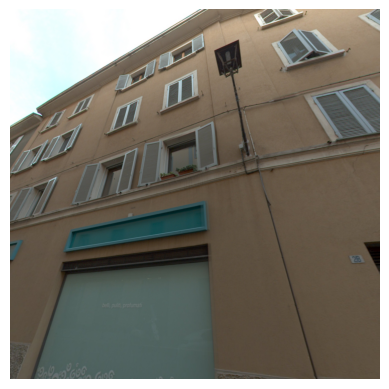

Facade length: 18.26365703765378
Using projection-based method due to close distance (<5m).
Best FOV: 105 from projected
block_0 181 2427080 POINT (605131.5536334473 4962360.968118127) S pano_000117_000063.jpg


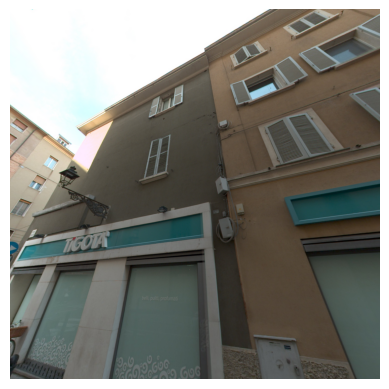

Facade length: 7.930991564853101
Maximizing FOV (facade length <10m).
Best FOV: 89.04271866440631 from facade_end
block_0 6 182136604 POINT (605134.2705959831 4962390.963198035) N pano_000116_000069.jpg


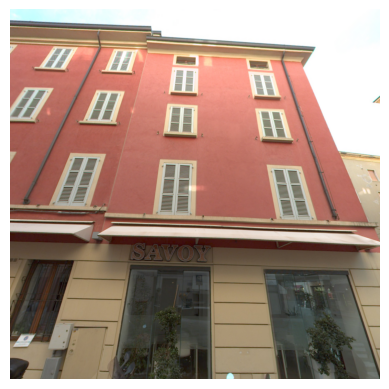

Facade length: 14.453140889386546
Minimizing FOV (facade length >10m).
Best FOV: 100 from midpoint
block_0 4 182136595 POINT (605144.7712585563 4962387.090417201) N pano_000116_000066.jpg


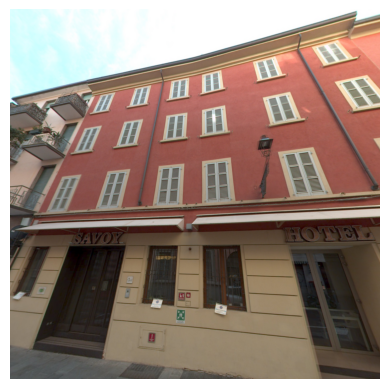

Facade length: 7.872038583022583
Maximizing FOV (facade length <10m).
Best FOV: 80.79153720841445 from facade_end
block_0 136 182138240 POINT (605155.2402986144 4962383.2171309255) N pano_000116_000062.jpg


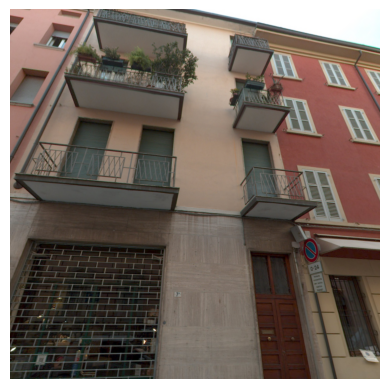

Facade length: 4.327097697732693
Maximizing FOV (facade length <10m).
Best FOV: 92.23069568112673 from facade_end
block_0 122 182138083 POINT (605160.9584120393 4962381.093957091) N pano_000116_000060.jpg


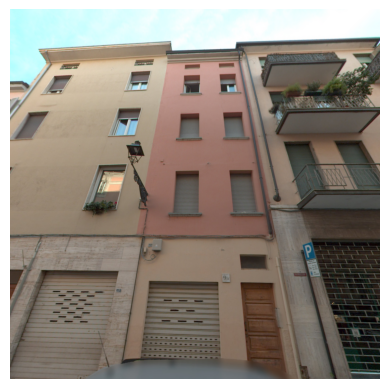

Facade length: 7.540268184874763
Maximizing FOV (facade length <10m).
Best FOV: 81.82049205824245 from facade_end
block_0 5 182136600 POINT (605166.5213258333 4962379.02936293) N pano_000116_000058.jpg


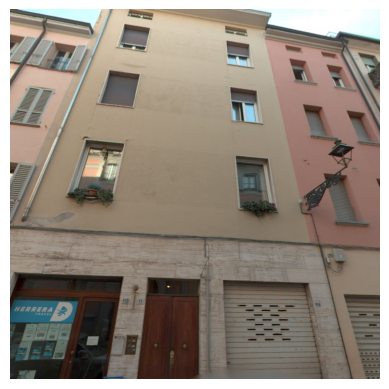

Facade length: 3.873488511131893
Maximizing FOV (facade length <10m).
Best FOV: 96.78013279341616 from facade_end
block_0 112 182137955 POINT (605171.8656830523 4962377.027864454) N pano_000116_000056.jpg


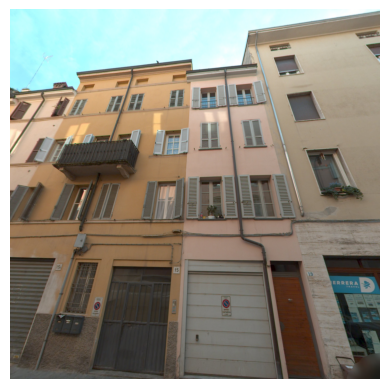

Facade length: 6.723238875786115
Maximizing FOV (facade length <10m).
Best FOV: 91.96105846582817 from facade_end
block_0 109 182137941 POINT (605176.8317812656 4962375.18129717) N pano_000116_000054.jpg


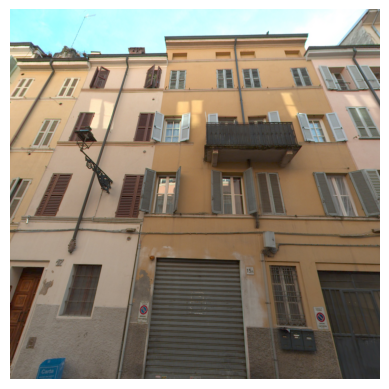

Facade length: 3.880839459060689
Maximizing FOV (facade length <10m).
Best FOV: 85.98786033078592 from facade_end
block_0 108 182137940 POINT (605181.8018356322 4962373.334797351) N pano_000116_000053.jpg


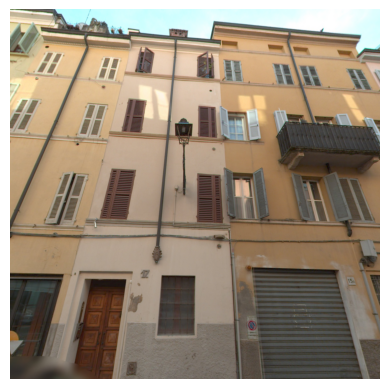

Facade length: 4.268184572718231
Maximizing FOV (facade length <10m).
Best FOV: 99.70203361636786 from facade_end
block_0 94 182137728 POINT (605185.6142868828 4962371.897146926) N pano_000116_000051.jpg


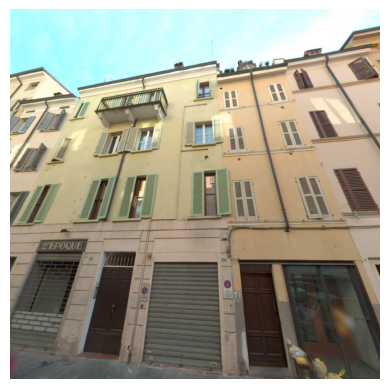

Facade length: 8.941767495606015
Maximizing FOV (facade length <10m).
Setting FOV to 90.
Best FOV: 90 from facade_end
block_0 169 2427048 POINT (605191.8021734767 4962369.587239882) N pano_000116_000049.jpg


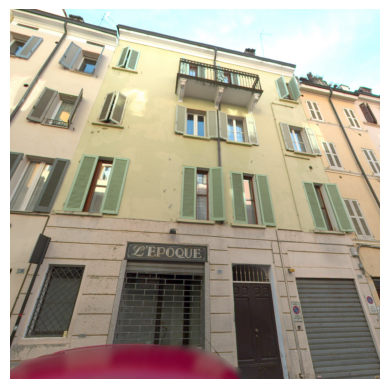

Facade length: 3.51758637344224
Maximizing FOV (facade length <10m).
Best FOV: 97.22499020422873 from facade_end
block_0 101 182137837 POINT (605197.6473844483 4962367.4328432735) N pano_000116_000047.jpg


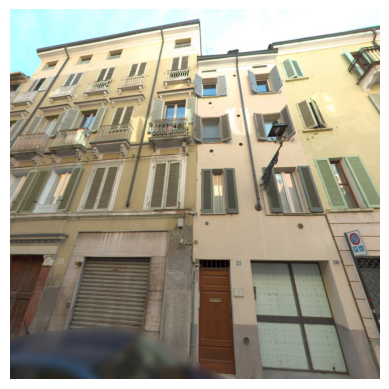

Facade length: 11.153841025196446
Minimizing FOV (facade length >10m).
Best FOV: 100 from midpoint
block_0 34 182136815 POINT (605204.519729262 4962364.867477639) N pano_000116_000045.jpg


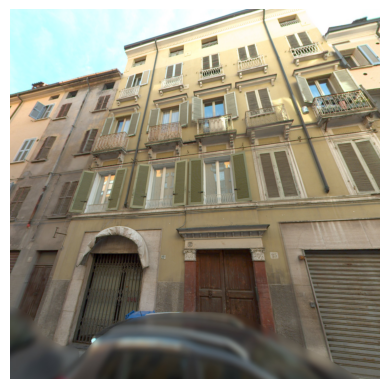

Facade length: 4.646439925878917
Maximizing FOV (facade length <10m).
Best FOV: 92.3743719174453 from facade_end
block_0 16 182136664 POINT (605211.9250928299 4962362.116390858) N pano_000116_000042.jpg


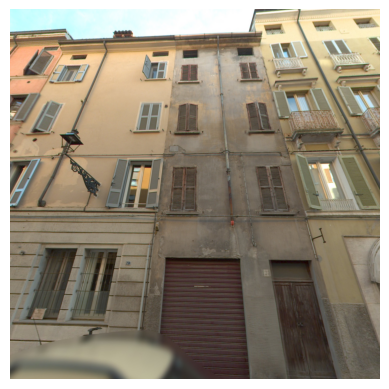

Facade length: 5.827200083419667
Maximizing FOV (facade length <10m).
Best FOV: 94.0591533605518 from facade_end
block_0 15 182136662 POINT (605216.8619003221 4962360.36937627) N pano_000116_000040.jpg


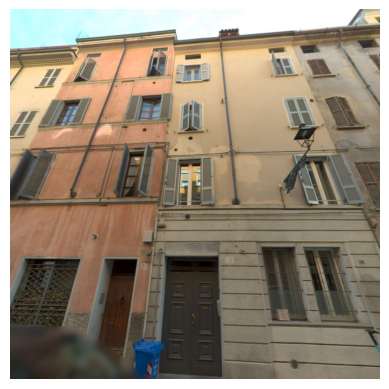

Facade length: 6.11093989951826
Maximizing FOV (facade length <10m).
Best FOV: 93.70946815537482 from facade_end
block_0 166 2427037 POINT (605222.4870236414 4962358.372515196) N pano_000116_000038.jpg


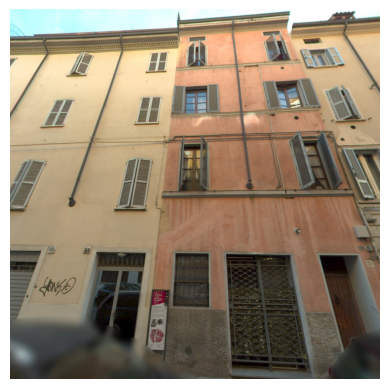

Facade length: 10.023391079418236
Minimizing FOV (facade length >10m).
Best FOV: 100 from midpoint
block_0 14 182136652 POINT (605230.081742066 4962355.65232951) N pano_000116_000036.jpg


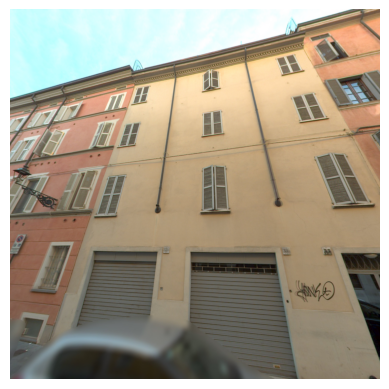

Facade length: 14.109787788856812
Minimizing FOV (facade length >10m).
Best FOV: 100 from midpoint
block_0 28 182136749 POINT (605241.4552208579 4962351.621764114) N pano_000116_000032.jpg


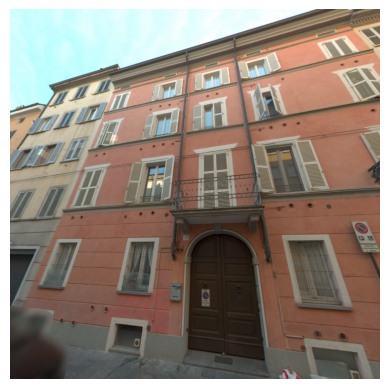

Facade length: 6.470586051753183
Maximizing FOV (facade length <10m).
Best FOV: 92.0336032730152 from facade_end
block_0 103 182137892 POINT (605251.1425772081 4962348.152508633) N pano_000116_000028.jpg


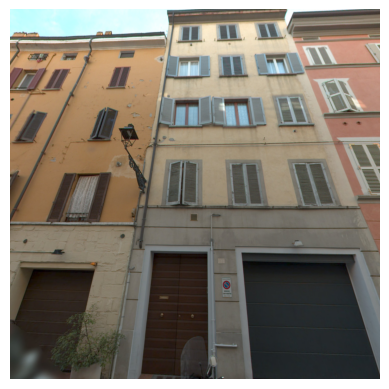

Facade length: 10.3625409446938
Minimizing FOV (facade length >10m).
Best FOV: 100 from projected
block_0 10 182136612 POINT (605259.0523239998 4962345.276399767) N pano_000116_000026.jpg


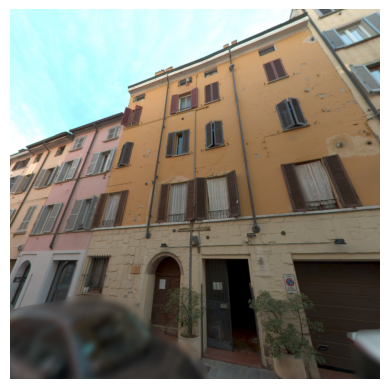

Facade length: 4.982111792355633
Maximizing FOV (facade length <10m).
Best FOV: 90.24919593949059 from facade_end
block_0 72 182137474 POINT (605266.2732138163 4962342.683468508) N pano_000116_000023.jpg


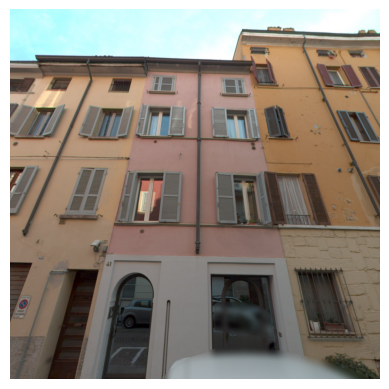

Facade length: 5.00207844395891
Maximizing FOV (facade length <10m).
Best FOV: 98.55233089085179 from facade_end
block_0 133 182138214 POINT (605270.9604041779 4962340.96574079) N pano_000116_000021.jpg


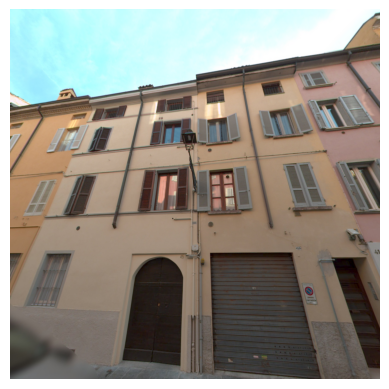

Facade length: 6.976056962142568
Maximizing FOV (facade length <10m).
Best FOV: 92.08793412623704 from facade_end
block_0 121 182138080 POINT (605276.582700306 4962338.902211865) N pano_000116_000019.jpg


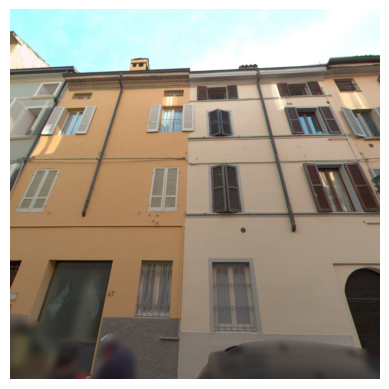

Facade length: 4.050467313007819
Maximizing FOV (facade length <10m).
Best FOV: 84.85301012626289 from facade_end
block_0 84 182137642 POINT (605281.7668752945 4962337.025960088) N pano_000116_000018.jpg


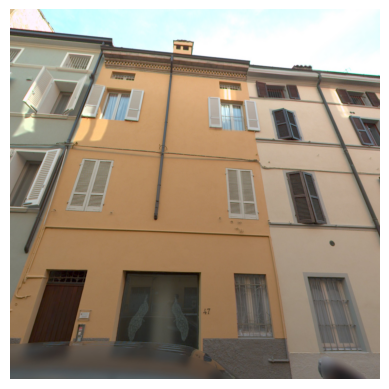

Facade length: 5.480109862120597
Maximizing FOV (facade length <10m).
Best FOV: 88.91647274523359 from facade_end
block_0 116 182137975 POINT (605286.2355125251 4962335.371332195) N pano_000116_000016.jpg


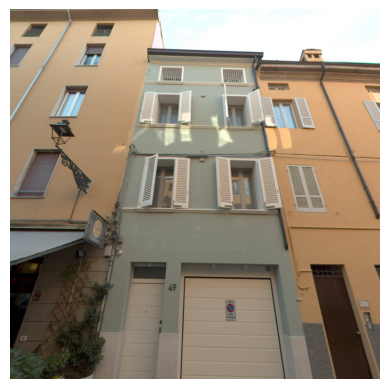

Facade length: 5.480111421967599
Maximizing FOV (facade length <10m).
Best FOV: 93.29951213107671 from facade_end
block_0 47 182136877 POINT (605291.3613844321 4962333.433021115) N pano_000116_000014.jpg


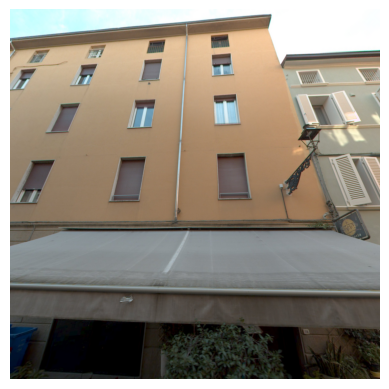

Facade length: 14.164273649977254
Minimizing FOV (facade length >10m).
Best FOV: 100 from midpoint
block_0 47 182136877 POINT (605300.4250273625 4962329.653620832) N pano_000116_000011.jpg


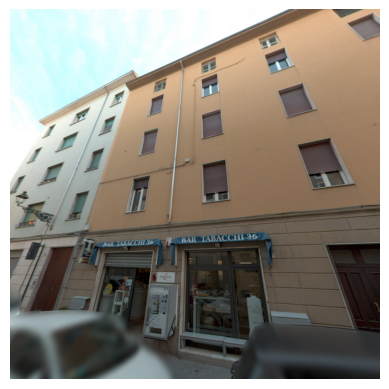

Facade length: 13.489700102840736
Minimizing FOV (facade length >10m).
Best FOV: 100 from midpoint
block_0 8 182136607 POINT (605313.1119913978 4962324.155770952) N pano_000116_000006.jpg


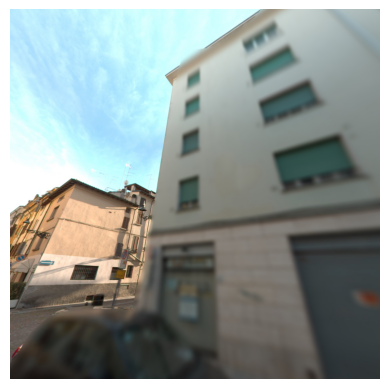

Facade length: 4.09007086915197
Maximizing FOV (facade length <10m).
Best FOV: 100 from midpoint
block_0 62 182137189 POINT (605321.1744215561 4962320.654442409) N pano_000116_000003.jpg


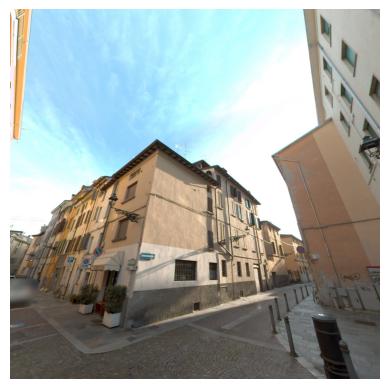

Facade length: 6.461711909359827
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 74 182137491 POINT (605301.1746041913 4962287.998296874) S pano_000117_000002.jpg


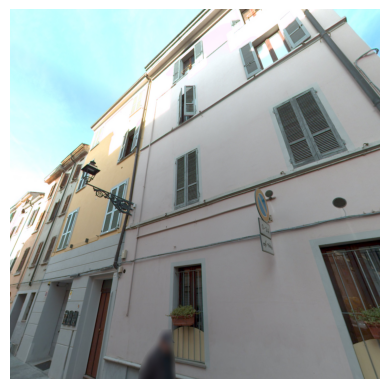

Facade length: 12.361263035932124
Using projection-based method due to close distance (<5m).
Best FOV: 100 from projected
block_0 163 2427027 POINT (605292.611158983 4962291.902564376) S pano_000117_000005.jpg


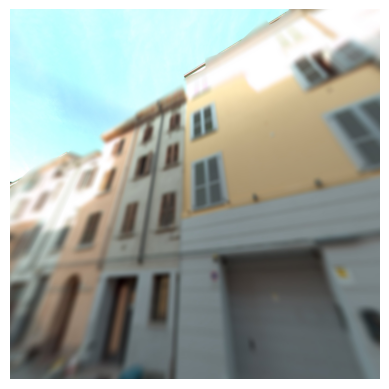

Facade length: 4.670611189856188
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 69 182137376 POINT (605284.8607103209 4962295.431256929) S pano_000117_000008.jpg


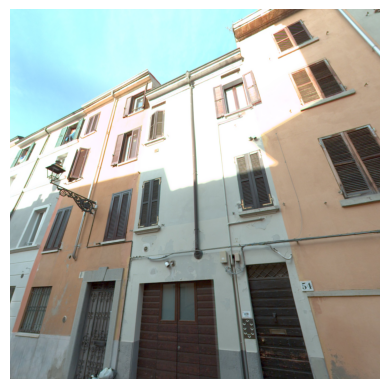

Facade length: 4.751689655991658
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 137 182138243 POINT (605280.580699835 4962297.40009407) S pano_000117_000010.jpg


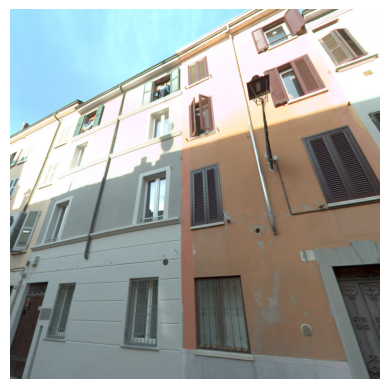

Facade length: 6.661737177156564
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 1 182136570 POINT (605275.3922614644 4962299.776288828) S pano_000117_000012.jpg


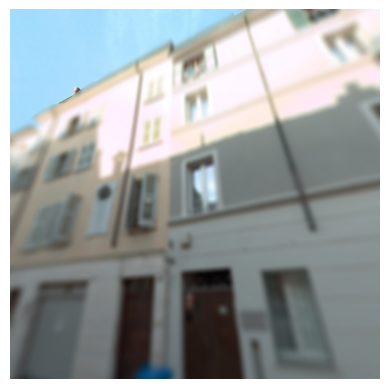

Facade length: 9.193526789486956
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 11 182136621 POINT (605268.1758577912 4962303.058188269) S pano_000117_000014.jpg


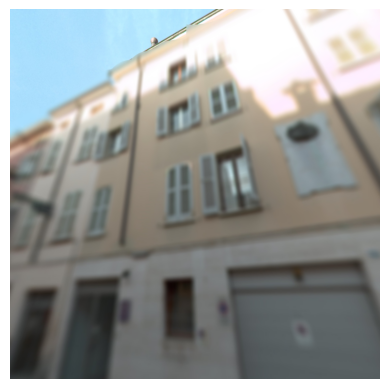

Facade length: 3.7251459204202546
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 2 182136574 POINT (605262.3020605787 4962305.74539811) S pano_000117_000016.jpg


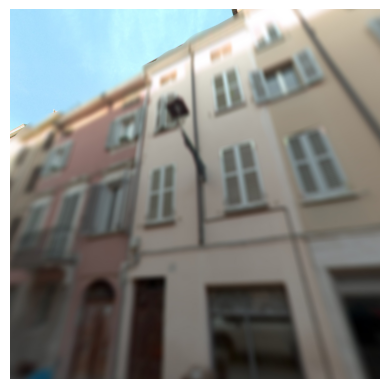

Facade length: 5.56136734991496
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 120 182138057 POINT (605258.0819204188 4962307.681896344) S pano_000117_000018.jpg


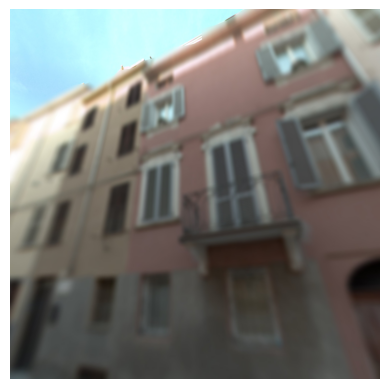

Facade length: 4.870673803842747
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 71 182137460 POINT (605253.3321693218 4962309.837508211) S pano_000117_000020.jpg


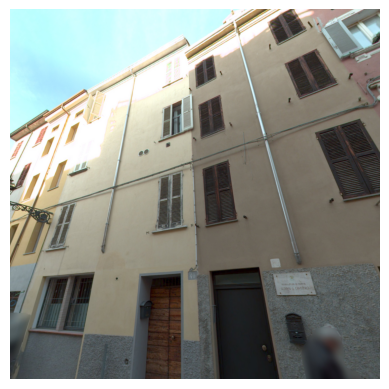

Facade length: 5.647230368228885
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 167 2427043 POINT (605248.5502439637 4962312.025931019) S pano_000117_000021.jpg


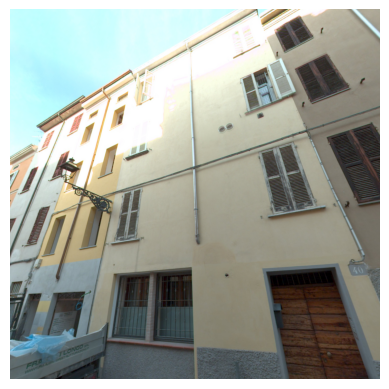

Facade length: 3.3881589903350977
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 111 182137952 POINT (605244.426553959 4962313.869569985) S pano_000117_000023.jpg


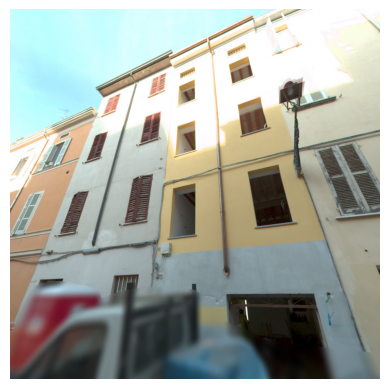

Facade length: 5.614460603584893
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 26 182136738 POINT (605240.2085629932 4962315.433884441) S pano_000117_000024.jpg


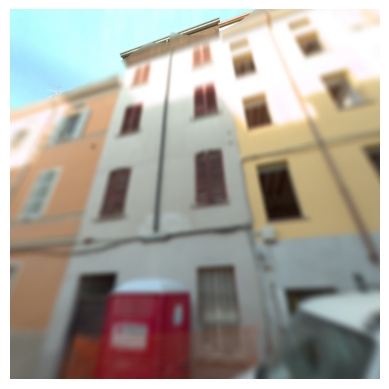

Facade length: 2.269509830546642
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 183 2427083 POINT (605236.5502719583 4962316.874027181) S pano_000117_000026.jpg


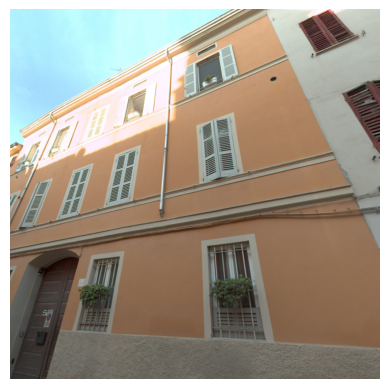

Facade length: 12.715112242975819
Using projection-based method due to close distance (<5m).
Best FOV: 105 from projected
block_0 183 2427083 POINT (605229.8011200549 4962320.1247298075) S pano_000117_000028.jpg


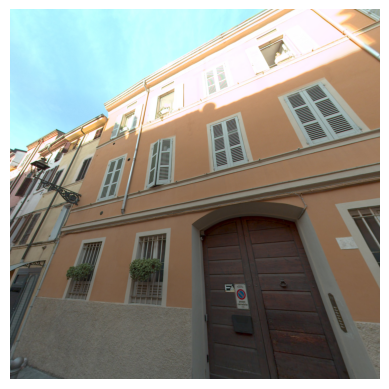

Facade length: 3.5253058132513653
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 104 182137901 POINT (605222.4590953263 4962323.593512869) S pano_000117_000031.jpg


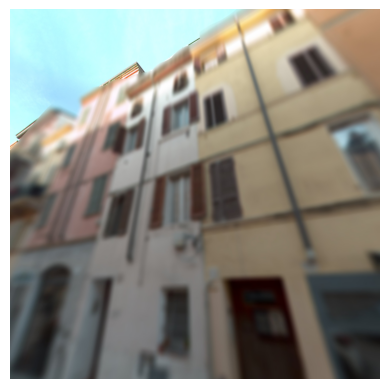

Facade length: 3.6633811382785595
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 102 182137853 POINT (605219.2067128094 4962325.123645015) S pano_000117_000032.jpg


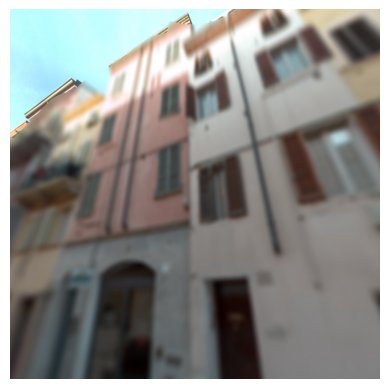

Facade length: 3.782177782988232
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 87 182137654 POINT (605215.8005800567 4962326.623483861) S pano_000117_000033.jpg


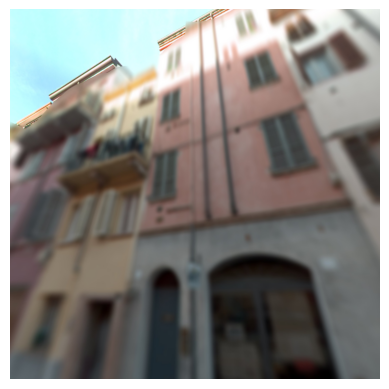

Facade length: 3.369115954380279
Using projection-based method due to close distance (<5m).
Best FOV: 90 from projected
block_0 78 182137556 POINT (605212.4879364334 4962327.969295556) S pano_000117_000034.jpg


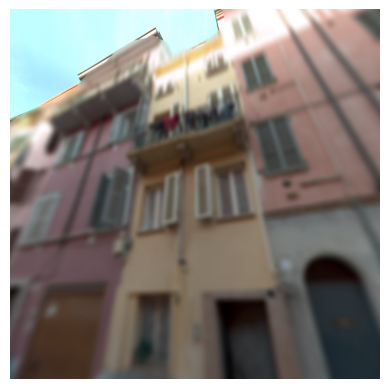

Facade length: 5.019420054666677
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 60 182137110 POINT (605208.5829658262 4962329.49986359) S pano_000117_000036.jpg


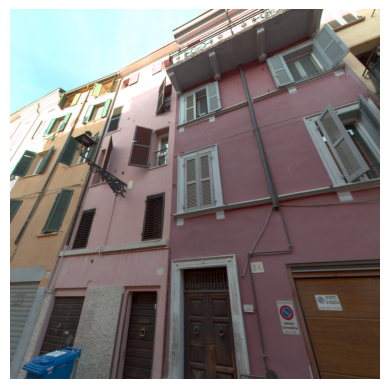

Facade length: 3.449024392568471
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 96 182137766 POINT (605204.6459102365 4962331.057686775) S pano_000117_000037.jpg


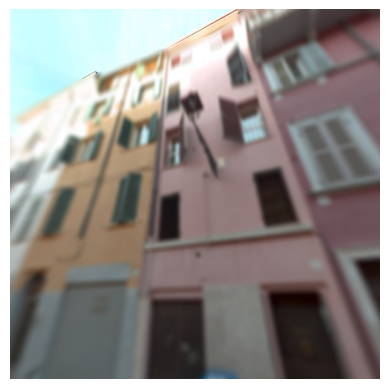

Facade length: 4.234672996984885
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 91 182137721 POINT (605201.0826239454 4962332.493848888) S pano_000117_000038.jpg


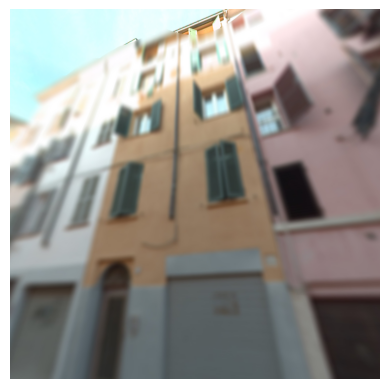

Facade length: 3.7051233879390097
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 115 182137972 POINT (605197.3961287781 4962333.966886216) S pano_000117_000040.jpg


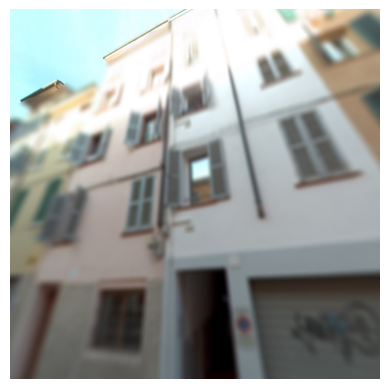

Facade length: 4.4571111098531775
Using projection-based method due to close distance (<5m).
Best FOV: 95 from projected
block_0 97 182137768 POINT (605193.6137396365 4962335.499468997) S pano_000117_000041.jpg


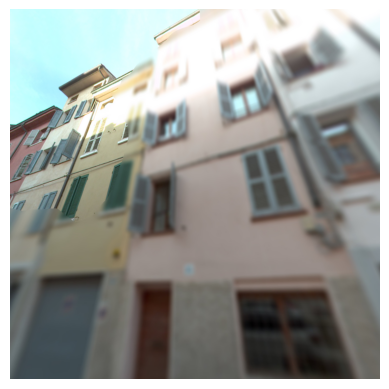

Facade length: 27.61664347032596
Facade to far from camera, probably part of block not facing street


In [6]:
# Main loop to apply the 6-fold FOV evaluation and pitch adjustment
plt.close('all')
%matplotlib inline

images_folder = 'data/PANO/'

for i, row in gdf_combined.iterrows():
    camera_coords = (row.loc['X'], row.loc['Y'], row.loc['Z'])
    midpoint_coords = (row.loc['geometry_midpoint'].x, row.loc['geometry_midpoint'].y, row.loc['Z'] + 0.25) 

    # Calculate facade extremes and midpoint
    facade_start = (row.loc['geometry_outer_edge'].coords[0][:2])
    facade_end = (row.loc['geometry_outer_edge'].coords[-1][:2])

    facade_length = np.linalg.norm(np.array([facade_end[0], facade_end[1]]) - np.array([facade_start[0], facade_start[1]]))
    print(f"Facade length: {facade_length}")
    
    target_z = midpoint_coords[2]
    
    # Evaluate the FOV for multiple points and select the best
    target_coords, yaw, pitch, fov = evaluate_fov_for_multiple_points(camera_coords, midpoint_coords, facade_start, facade_end, target_z, facade_length)
    if target_coords is None:
        continue

    # Apply dynamic pitch adjustment based on the distance
    pitch = calculate_pitch_adjustment_based_on_distance(camera_coords, midpoint_coords, pitch)

    # Load the image
    path = row.loc['PATH']
    run = row.loc['RUN']
    image_name = row.loc['FOTO']
    image_path = '{}{}/{}/{}'.format(images_folder, path, run, image_name)
    image = cv2.imread(image_path)
    
    rgb_image = convert_bgr_to_rgb(image)
    roll = row.loc['Roll']

    # Define output image dimensions
    output_image_shape = 'squared'
    if output_image_shape == 'squared':
        output_width = 1024
        output_height = 1024
    elif output_image_shape == 'horizontal':
        output_width = 1024
        output_height = 512
    elif output_image_shape == 'vertical':
        output_width = 512
        output_height = 1024

    # Apply the perspective transformation
    output_image = enhanced_equirectangular_to_perspective(rgb_image, fov, yaw, pitch, roll, output_height, output_width)

    # Display results
    print(row.loc['group_id'], row.loc['building_id'], row.loc['osm_id'], row.loc['geometry_midpoint'], row.loc['orientation_midpoint'], image_name)
    plt.imshow(output_image)
    plt.axis('off')
    plt.show()

    plt.close('all')
